In [1]:
# scikit learn

In [2]:
# imports

# linalg
import math
import numpy as np
import pandas as pd

# visualization
import matplotlib.pyplot as plt
import seaborn as sns
sns.set(style='white', color_codes=True)
%matplotlib inline

# pre-processing
from sklearn.pipeline import make_pipeline  
from sklearn.preprocessing import StandardScaler
from sklearn.model_selection import train_test_split # train test split

# decomposition
from sklearn.decomposition import PCA

# supervised algorithms
from sklearn.linear_model import LinearRegression # linear regression
from sklearn.linear_model import RANSACRegressor # linear regression
from sklearn.linear_model import LogisticRegression #logistic regression
from sklearn.model_selection import GridSearchCV
from sklearn import svm #support vector Machine
from sklearn.ensemble import RandomForestClassifier #Random Forest
from sklearn.neighbors import KNeighborsClassifier #KNN
from sklearn.naive_bayes import GaussianNB #Naive bayes
from sklearn.tree import DecisionTreeClassifier #Decision Tree

# unsupervised algorithms
from sklearn.cluster import KMeans

# metrics
from sklearn import metrics #accuracy measure
from sklearn.metrics import confusion_matrix #for confusion matrix
from sklearn.metrics import classification_report

# cross validation
from sklearn.model_selection import KFold
from sklearn.model_selection import cross_val_score
from sklearn.model_selection import cross_val_predict

# misc
import sys,os
from IPython.display import Image, display

# to show images
def show_image(fn, width=500):
    fp1 = os.path.join('./diagrams/', fn)
    display(Image(filename=fp1, width=width))


In [15]:
# versions
print(f"np: {np.__version__}")
print(f"pd: {pd.__version__}")
print(f"sns: {sns.__version__}")
print(f"py: {sys.version_info[0:3]}") # sys.version


np: 1.17.3
pd: 0.25.2
sns: 0.9.0
py: (3, 7, 3)


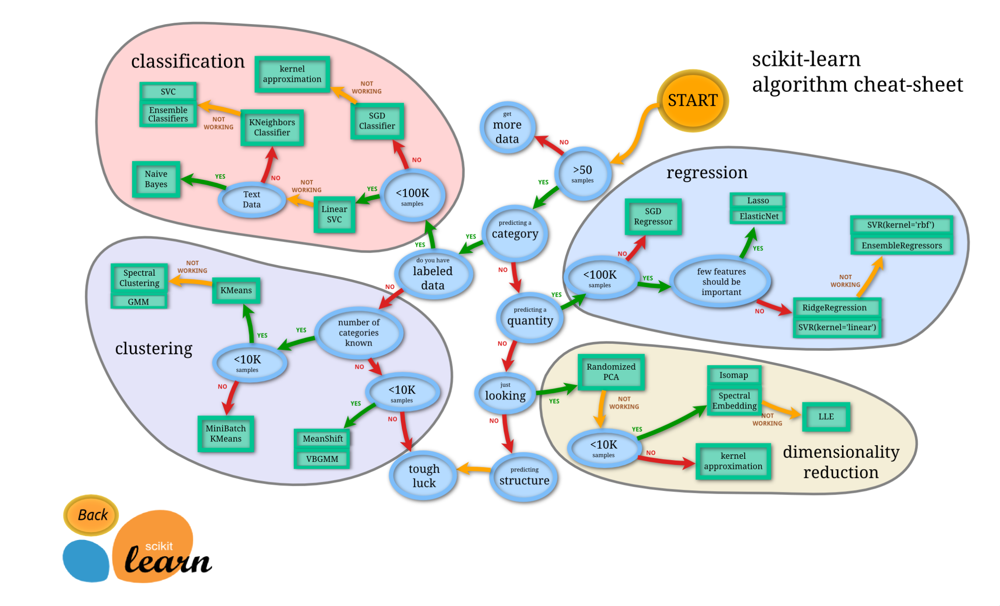

In [4]:
# algorithms
show_image(fn='algorithm-flow.png', width=1000)

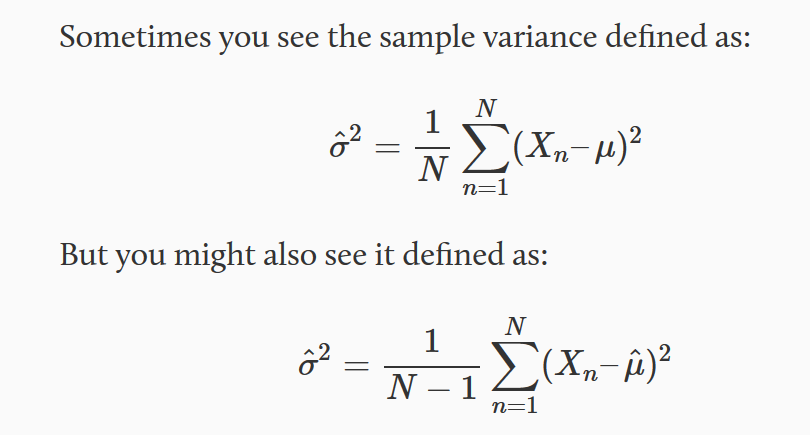

In [5]:
# covariance
    # biased and unbiased
    # use 'n-1' in sample variance (umbiased estimator of the population variance)
    # https://web.ma.utexas.edu/users/mks/M358KInstr/SampleSDPf.pdf
show_image(fn='covariance.png')

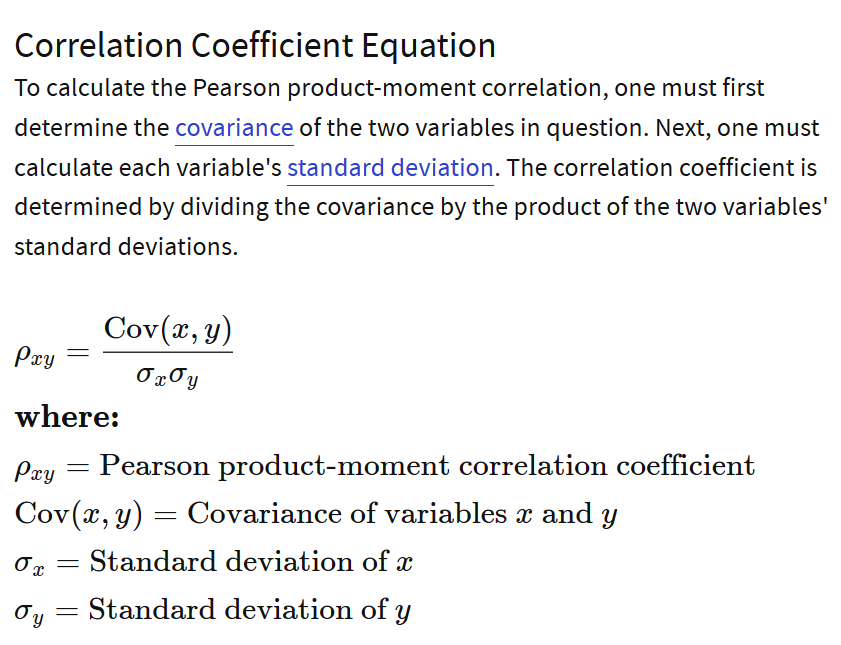

In [6]:
# correlation (Pearson product-moment correlation)
    # R2 -- coefficient of determination
show_image(fn='correlation.png')

In [7]:
# df details (housing)

# import csv as df
df = pd.read_csv('./data/USA_Housing.csv')

# get details about the df

# df.info()
    # entries, columns, data types, memory usage
# df.describe()
    # count, mean, std, min, quartile ranges, max
# df.columns
    # column names
# df.head()
    # first 5 rows
# df.corr()
    # correlation between each row
# df['Avg. Area Income'].corr(df['Price']
    # correlation between two rows
# sns.heatmap(df.corr(), annot=True, cmap="YlGnBu")
    # heatmap
    # BROKEN IN MATPLOTLIB 3.1.1

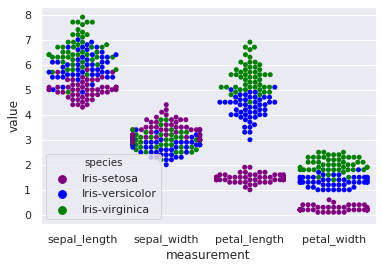

In [104]:
# df visualization (iris)

df = pd.read_csv('./data/iris.data', header=None)
df.columns=['sepal_length', 'sepal_width', 'petal_length', 'petal_width', 'species']

# plt histogram
# plt.hist(df['sepal_length'])

# pandas histograms
# df.hist(edgecolor='white', linewidth=1.2, figsize=(12,8))

# pandas boxplots
# df.boxplot(by='species', figsize=(12,8))

# pandas pairplot 
# pd.plotting.scatter_matrix(df, figsize=(12,10))

# sns distplot (histogram)
# sns.distplot(df['sepal_length'])

# sns kde (probability curve)
# sns.kdeplot(df['sepal_length'], shade=True)

# sns scatterplot (bivariate)
# sns.scatterplot(x=df['sepal_length'], y=df['sepal_width'], hue=df['species'], style=df['species'])

# sns jointplot (bivariate)
# sns.jointplot(x=df['sepal_length'], y=df['sepal_width'])

# sns jointplot (bivariate) (hex)
# sns.jointplot(x=df['sepal_length'], y=df['sepal_width'], kind="hex")

# sns jointplot (bivariate) (kde)
# sns.jointplot(x=df['sepal_length'], y=df['sepal_width'], kind='kde')

# sns kde plot (bivariate) 
# sns.kdeplot(data=df['sepal_length'], data2=df['sepal_width'])

# sns kde plot (bivariate) (dark)
# cmap = sns.cubehelix_palette(as_cmap=True, dark=0, light=1, reverse=True)
# sns.kdeplot(data=df['sepal_length'], data2=df['sepal_width'], cmap=cmap, n_levels=60, shade=True)

# sns violin plot
# plt.figure(figsize=(12,8));
# plt.subplot(2,2,1)
# sns.violinplot(x='species', y='sepal_length', data=df)
# plt.subplot(2,2,2)
# sns.violinplot(x='species', y='sepal_width', data=df)
# plt.subplot(2,2,3)
# sns.violinplot(x='species', y='petal_length', data=df)
# plt.subplot(2,2,4)
# sns.violinplot(x='species', y='petal_width', data=df)

# sns boxplot
# sns.boxplot(x=df['species'], y=df['sepal_width'])

# sns melted swarmplot
data = pd.melt(df, 'species', var_name='measurement')
sns.swarmplot(x='measurement', y='value', hue='species', palette=['purple','blue','green'], data=data)

# sns pairplot (compare all columns against each other)
# sns.pairplot(df, hue='species', height=3, aspect=1)


# NOT APPLICABLE HERE
# sns line plot 
# sns.lineplot(x=df['sepal_length'], y=df['sepal_width'], hue=df['species'], style=df['species'])

# NOT APPLICABLE HERE
# sns catplot (NOT APPLICABLE HERE)
# sns.catplot(x=df['species'], y=df['sepal_width'], hue=df['species'], kind='bar', palette='muted')


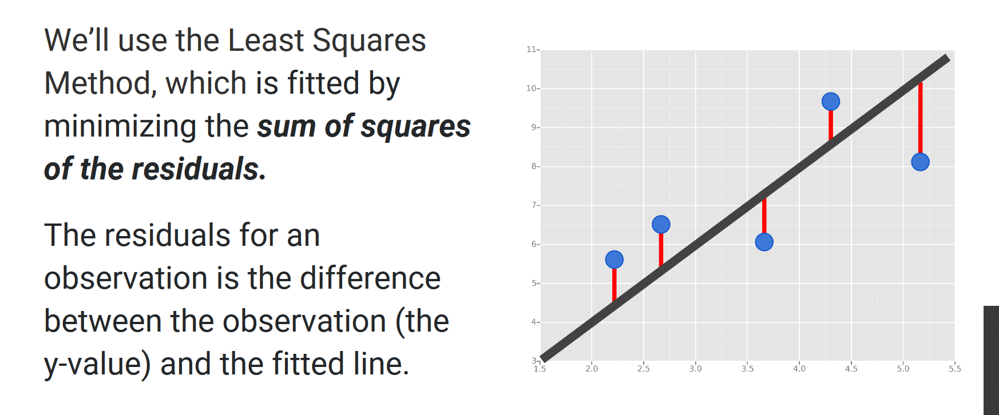

In [8]:
# linear regression
show_image(fn='least-squares.png')

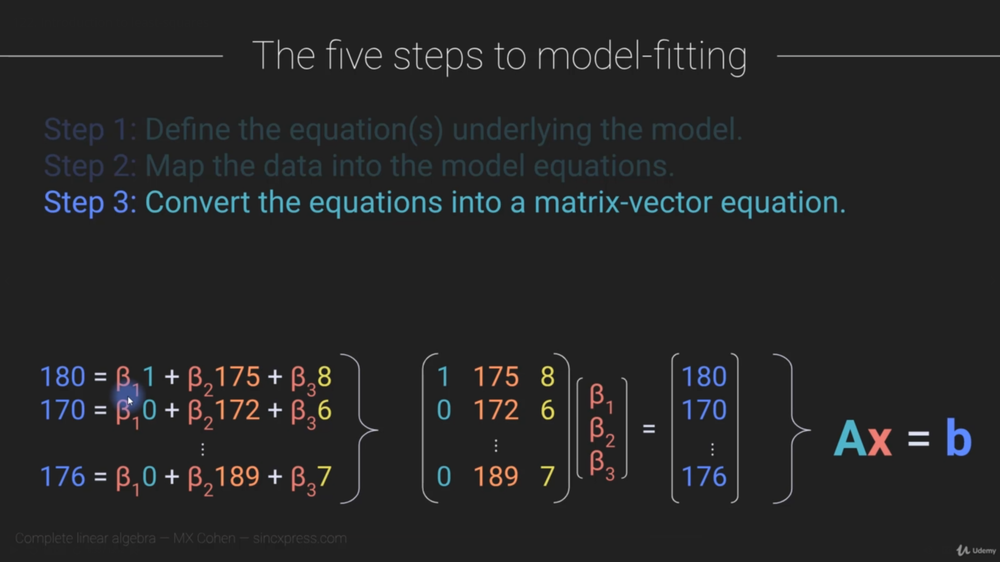

In [9]:
# coefficients (model-fitting)
show_image(fn='model-fitting.png')

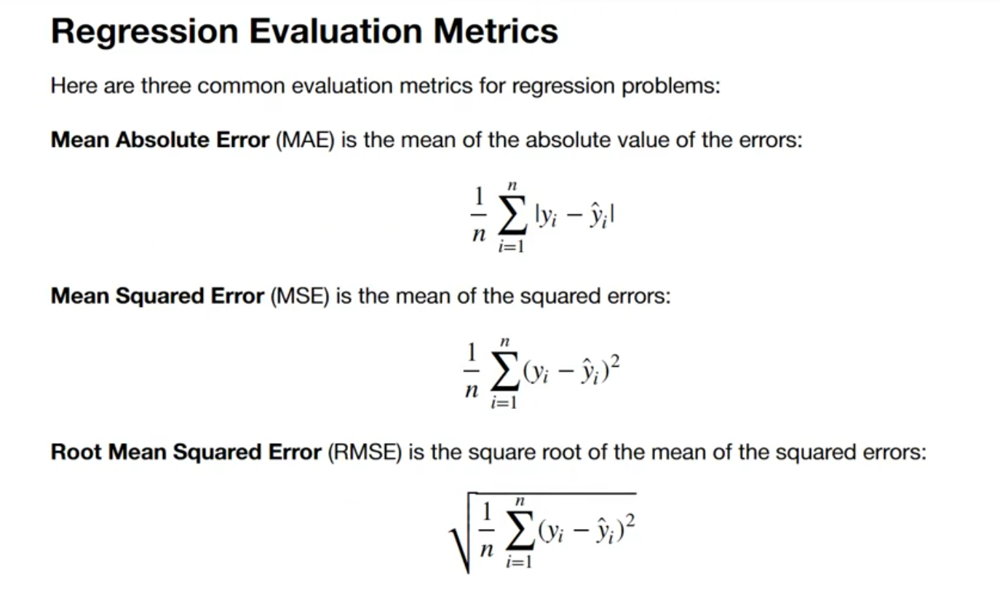

In [10]:
# model evaluation
    # MAE -- average error
    # MSE -- punishes larger errors
    # RMSE -- MSE, but in the units of 'y'
show_image(fn='model-eval.png')

In [ ]:
# using sklearn models
    # choose a model
    # set hyperparameters
    # arrange data into features (matrix) and target (vector)
    # train/test split
    # fit model to data
    # evaluate model by using it on test (unseen) data

In [ ]:
# coefficient of determination (R2) 
    # proportion of variance in y that is predictable from x
    # correlation (squared) between y_pred and y_true. ranges from 0 to 1.
    # R^2 == 0 means y cannot be predicted
    # R^2 == 1 means y can be predicted without error.
# linear regression estimator object
    # lr = LinearRegression() # estimator object
    # lr.fit() # fits linear model
    # lr.predict() # predict Y using linear model
    # lr.score() # coefficient of determination
# multivariate
    # y(w,x) = w + wx + wx + wx + wx ...
    # output = intercept + coef1*input1 + coef2*input2 + coef3*input3 ...

In [146]:
# linear regression (example)

# import csv as df
df = pd.read_csv('./data/USA_Housing.csv')

# features
X = df[[
    'Avg. Area Income', 'Avg. Area House Age', 'Avg. Area Number of Rooms', 
    'Avg. Area Number of Bedrooms', 'Area Population'
]]
# target
y = df['Price']
# train test split
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=.2, random_state=101)
# model
lr = LinearRegression() # instantiate
lr.fit(X_train, y_train)
# model details
    # lr.intercept_
    # X.columns
    # lr.coef_
    # lr.summary()
# predictions
y_pred = lr.predict(X_test)
# evaluate model
MAE = metrics.mean_absolute_error(y_test, y_pred)
MSE = metrics.mean_squared_error(y_test, y_pred)
RMSE = np.sqrt(MSE)
R2 = metrics.r2_score(y_test, y_pred)
print( f"MAE: {MAE}" )
print( f"MSE: {MSE}" )
print( f"RMSE: {RMSE}" )
print( f"coefficient of determination: {R2}")

# visualize
# plt.scatter(y_test, y_pred)
# sns.distplot(y_test - y_pred)


MAE: 81305.23300085649
MSE: 10100187858.864878
RMSE: 100499.69083964825
coefficient of determination: 0.9211719165402232


y=mx+b
y=9.1x+-34.67
total squared_error: [22061.87919621]
rmse: [6.60307139]


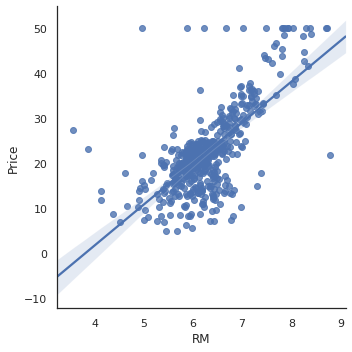

In [148]:
# ------------
# univariate linear regression (example)
# ------------

# univariate linear regression (one input)
    # y = mx + b # line equation
    # Y = AX # rewritten as matrices
        # A = [x 1] # horizontal
        # P = [m b] # vertical

# import dataset
from sklearn.datasets import load_boston
boston = load_boston()

# make df from dataset
df1 = pd.DataFrame(boston.data)
df1.columns = boston.feature_names
df1['Price'] = boston.target

# plot data (linear fit)
sns.lmplot(x = 'RM', y='Price', data=df1) # col1, col2, df

# linear regression (least squares)
X = df1['RM'] # column (medium room values)
X = np.vstack(X) # vertical stack (506 rows, 1 col)
X = np.array( list(map(lambda n: [n,1], X)), dtype='float') # x = np.array( [ [value,1] for value in x] )
y = df1['Price']

# least squares
result = np.linalg.lstsq(X,y, rcond=None) # least squares method
m, b = result[0]
squared_error = result[1]
rmse = np.sqrt(squared_error/len(X))
print("y=mx+b")
print(f"y={round(m,2)}x+{round(b,2)}")
print(f"total squared_error: {squared_error}")
print(f"rmse: {rmse}")

MAE: 3.5546801717407637
MSE: 26.88246896937119
RMSE: 5.184830659662009
coefficient of determination: 0.6877882573973316


Text(0.5, 1.0, 'Residual Plots')

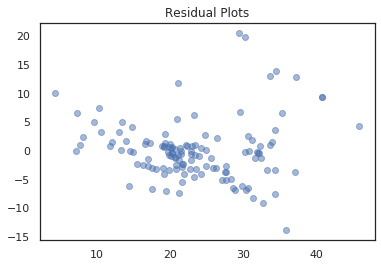

In [159]:
# ------------
# linear regression (sklearn) (multivariate)
# ------------

# multivariate linear regression 

# data
from sklearn.datasets import load_boston
boston = load_boston()
df = pd.DataFrame(boston.data, columns=boston['feature_names'])
# split
X = df1.drop('Price',1) # df1 without 'Price' col
y = df1['Price'] # 'Price' col
X_train, X_test, y_train, y_test = train_test_split(X, y)
# model
lr = LinearRegression() # sklearn.linear_model.LinearRegression
lr.fit(X_test, y_test)
# lr model details
    # lr.intercept_
    # lr.coef_
    # lr.summary()
# predict
y_pred = lr.predict(X_test)
# metric
MAE = metrics.mean_absolute_error(y_test, y_pred) # mse = np.mean((y_test-y_pred) ** 2)
MSE = metrics.mean_squared_error(y_test, y_pred) # rmse = np.sqrt(mse_test / len(X_train))
RMSE = np.sqrt(MSE)
R2 = metrics.r2_score(y_test, y_pred)
print( f"MAE: {MAE}" )
print( f"MSE: {MSE}" )
print( f"RMSE: {RMSE}" )
print( f"coefficient of determination: {R2}")

# residual plot
    # visualization: where is the error occuring? 
    # residual = y_train - y_pred_train
    # testing to see if linear regression is a good choise
train = plt.scatter(y_pred,(y_test - y_pred), c='b', alpha=0.5)
plt.title('Residual Plots')


In [161]:
# ransac regressor (robust, multivariate linear regressor)
    # https://scikit-learn.org/stable/modules/linear_model.html#ransac-regression
    # fits a model to random sets of inliers
    # other robust regressors -- TheilSen and HuberRegressor 
        # https://scikit-learn.org/stable/auto_examples/linear_model/plot_robust_fit.html
    
# import csv as df
df = pd.read_csv('./data/USA_Housing.csv')

# features
X = df[[
    'Avg. Area Income', 'Avg. Area House Age', 'Avg. Area Number of Rooms', 
    'Avg. Area Number of Bedrooms', 'Area Population'
]]
# target
y = df['Price']
# train test split
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=.2, random_state=101)
# model
ransac = RANSACRegressor() # instantiate
ransac.fit(X_train, y_train)
# model details
    # ransac.intercept_
    # X.columns
    # ransac.coef_
# predictions
y_pred = ransac.predict(X_test)
# evaluate model
MAE = metrics.mean_absolute_error(y_test, y_pred)
MSE = metrics.mean_squared_error(y_test, y_pred)
RMSE = np.sqrt(MSE)
R2 = metrics.r2_score(y_test, y_pred)
print( f"MAE: {MAE}" )
print( f"MSE: {MSE}" )
print( f"RMSE: {RMSE}" )
print( f"coefficient of determination: {R2}")

MAE: 82434.56229225168
MSE: 10458256481.4796
RMSE: 102265.61729867767
coefficient of determination: 0.91837732859174


In [ ]:
# statsmodels (fitting models using R-style formulas)
    # https://www.statsmodels.org/dev/example_formulas.html
'''
lr_model = smf.ols(
    formula = 'y ~ col1 + col2 + col3 + col4', 
    data=df
)
res = lr_model.fit()
print(res.summary())
'''

MAE: 3.878234238202835
MSE: 27.861209050745835
RMSE: 5.2783718181600126
coefficient of determination: 0.7206515650998465


Text(0.5, 1.0, 'Residual Plots')

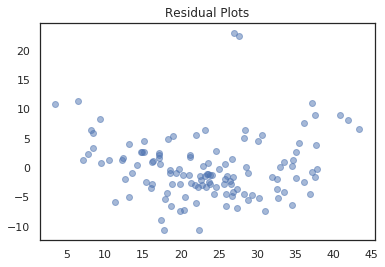

In [165]:
# ------------
# linear regression (sklearn) (multivariate) (scaler) (pipeline)
# ------------

# standardize variable to identify key features
    # pipeline: scaler --> model
    
# data
from sklearn.datasets import load_boston
boston = load_boston()
df = pd.DataFrame(boston.data, columns=boston['feature_names'])
# split
X = df1.drop('Price',1) # df1 without 'Price' col
y = df1['Price'] # 'Price' col
X_train, X_test, y_train, y_test = train_test_split(X, y)
# scaler
scaler = StandardScaler()
# model
lr = LinearRegression() # sklearn.linear_model.LinearRegression
# pipeline
scaled_lr = make_pipeline(scaler, lr)
scaled_lr.fit(X_test, y_test)

# lr model details
    # lr.intercept_
    # lr.coef_
    # lr.summary()
# predict
y_pred = scaled_lr.predict(X_test)
# metric
MAE = metrics.mean_absolute_error(y_test, y_pred) # mse = np.mean((y_test-y_pred) ** 2)
MSE = metrics.mean_squared_error(y_test, y_pred) # rmse = np.sqrt(mse_test / len(X_train))
RMSE = np.sqrt(MSE)
R2 = metrics.r2_score(y_test, y_pred)
print( f"MAE: {MAE}" )
print( f"MSE: {MSE}" )
print( f"RMSE: {RMSE}" )
print( f"coefficient of determination: {R2}")

# residual plot
    # visualization: where is the error occuring? 
    # residual = y_train - y_pred_train
    # testing to see if linear regression is a good choise
train = plt.scatter(y_pred,(y_test - y_pred), c='b', alpha=0.5)
plt.title('Residual Plots')



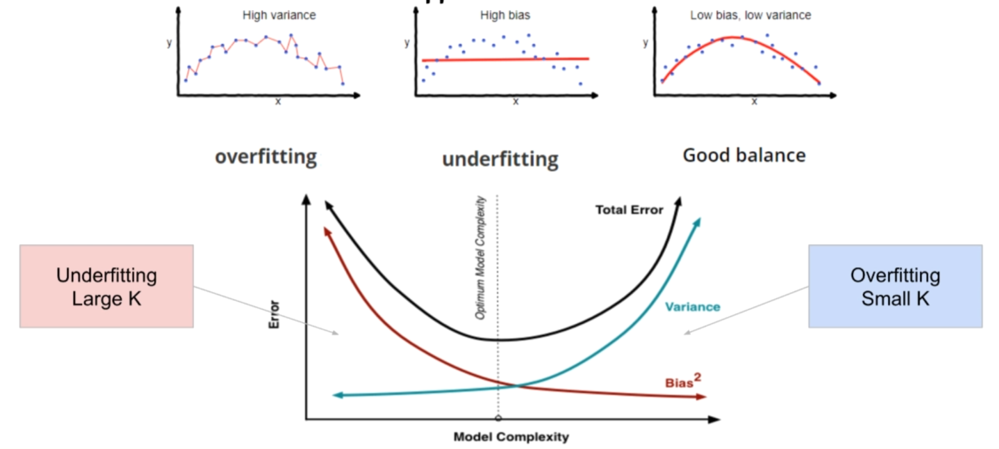

In [84]:
# bias variance trade-off
    # bias -- inaccuracy
    # variance -- imprecision
    # overfitting -- add complexity to a model until it fits the training set very well
    
# cross-validation
    # https://towardsdatascience.com/cross-validation-70289113a072
    
show_image(fn='bias-variance.png')

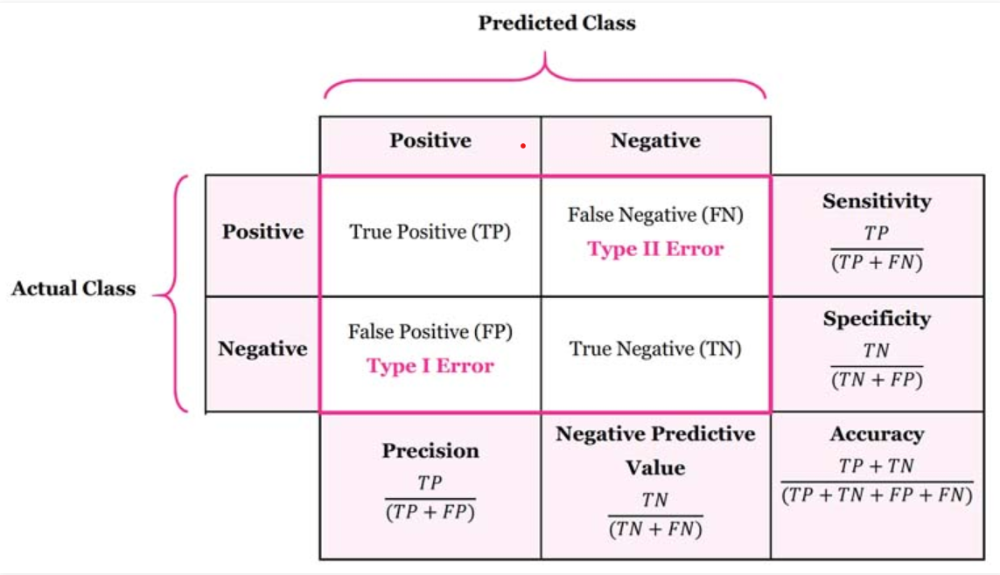

In [35]:
# confusion matrix
    # true positives 
    # true negatives
    # false positives (type I error)
    # false negatives (type II error)
    
# accuracy
    # true / total
# misclassification rate
    # false / total
    
show_image(fn='confusion-matrix.png')

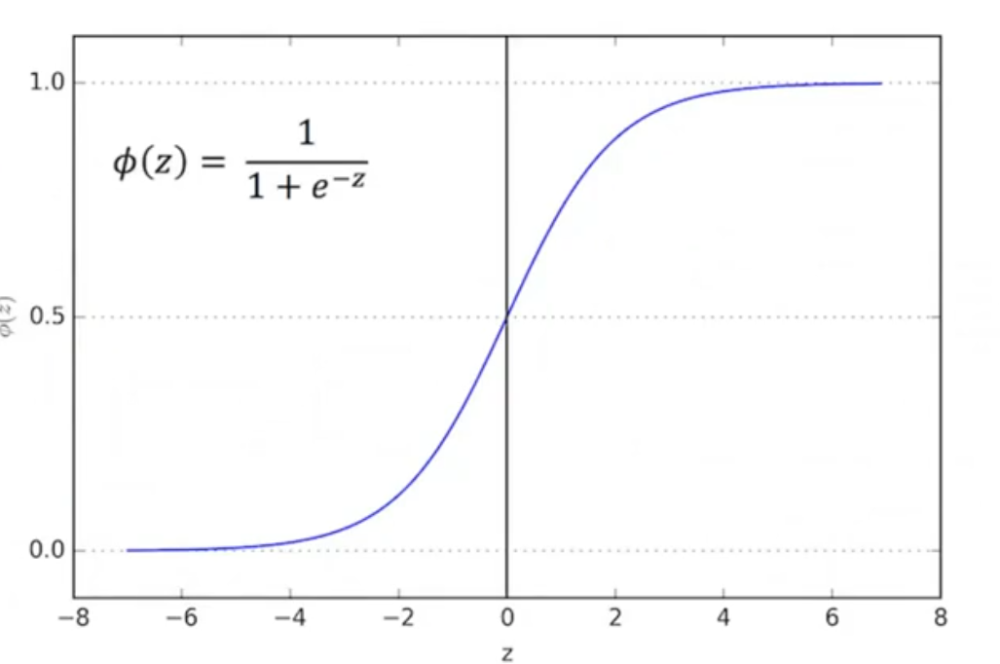

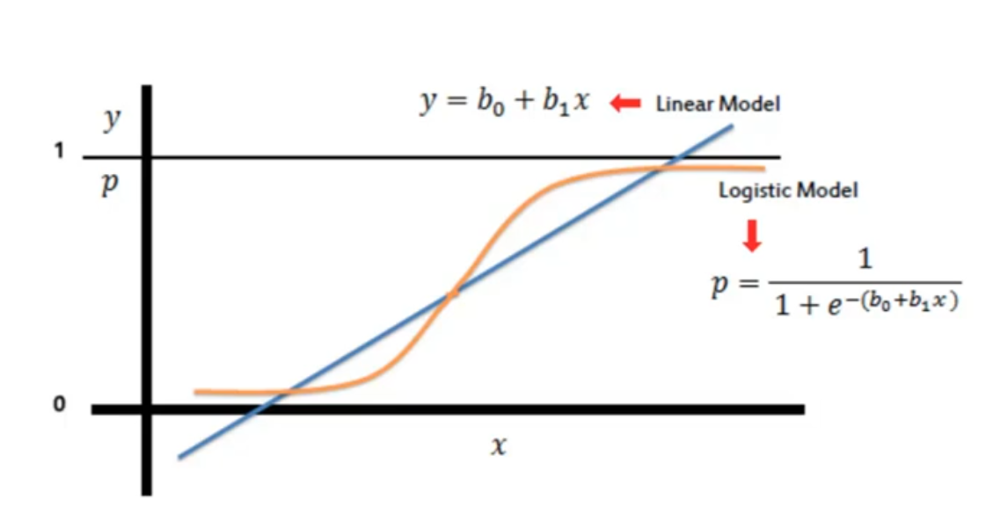

In [14]:
# sigmoid function (logistic function)
    # squashes values to fit range 0 - 1
show_image(fn='sigmoid.png')
show_image(fn='linear-vs-logistic.png')


Text(0.5, 1.0, 'Logistic Function Example')

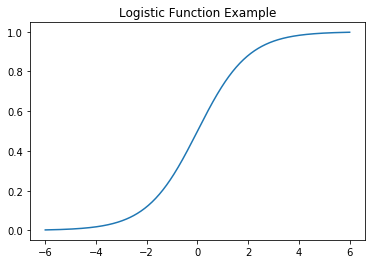

In [61]:
# ------------
# logistic function (sigmoid function)
# ------------

# sigmoid function is a special case of the logistic function (1 / (1 + e^-t))

# logistic function
def logistic(t):
    return (1.0 / (1 + math.exp((-1.0)*t)))
# input/output
t = np.linspace(-6,6,500)
y = np.array([logistic(n) for n in t])
# plot
plt.plot(t,y)
plt.title('Logistic Function Example')

In [15]:
# logistic regression

# data (already split into train/test)
train = pd.read_csv('./data/titanic_train.csv')
test = pd.read_csv('./data/titanic_test.csv')

# fill in missing values (imputation)
# impute age
    # determine average age, based on class
    # fill in null values with associated averages
def impute_age(cols):
    Age = cols[0]
    Pclass = cols[1]
    if pd.isnull(Age):
        if Pclass == 1:
            return 37
        elif Pclass == 2:
            return 29
        elif Pclass == 3:
            return 24
        else:
            return 30 # this fallback value is arbitrary. do better.
    else: return Age
# fill in 'age'
train['Age'] = train[['Age', 'Pclass']].apply(impute_age, axis=1)
# remove 'cabin'
train = train.drop('Cabin', axis=1)
# remove null rows (only a handful left)
train = train.dropna()
# convert categories into dummy values
    # drop_first should be true
    # http://www.statsmodels.org/dev/contrasts.html
sex = pd.get_dummies(train['Sex'], drop_first=True)
embark = pd.get_dummies(train['Embarked'], drop_first=True)
# replace categorical columns with dummy columns
train = pd.concat([train, sex, embark], axis=1)
# drop unusable columns
train = train.drop(['Sex', 'Embarked', 'Name', 'Ticket'], axis=1)

# split
y = train.Survived
X = train.drop('Survived', axis=1)
X_train, X_valid, y_train, y_valid = train_test_split(X, y, test_size=0.2, random_state=101)

# logistic regression
logr = LogisticRegression(solver='liblinear')
logr.fit(X_train, y_train)
y_pred = logr.predict(X_valid)
acc = metrics.accuracy_score(y_pred, y_valid)

print(f"Accuracy: {round(acc, 3)}")


Accuracy: 0.809


accuracy: 0.9777777777777777


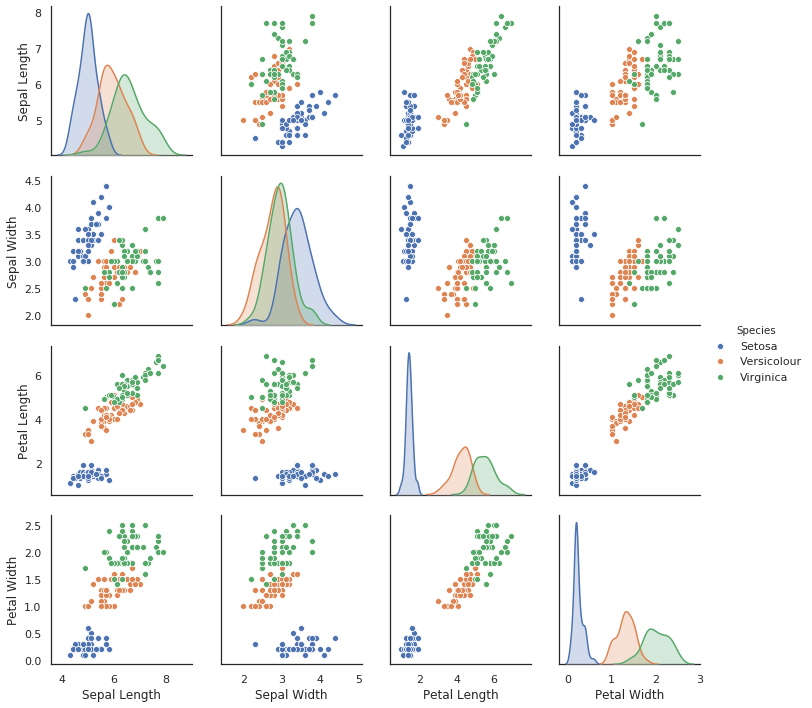

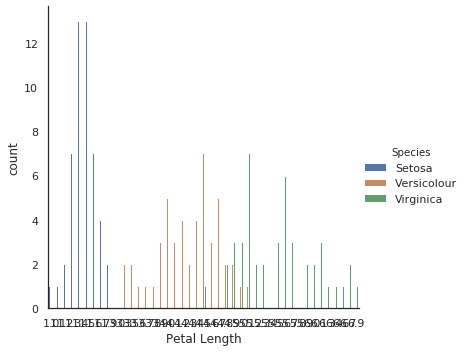

In [3]:
# ------------
# multi-class classification (logistic regression)
# ------------

# import dataset
from sklearn.datasets import load_iris
# extract dataset
iris = load_iris()
x = iris.data
y = iris.target
# split
X = pd.DataFrame(iris.data, columns=['Sepal Length', 'Sepal Width', 'Petal Length', 'Petal Width'])
y = pd.Series(iris.target)
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.3, random_state=101)
# model
logr = LogisticRegression(solver='lbfgs', multi_class='auto', max_iter=200)
logr.fit(X_train, y_train)
# predict
y_pred = logr.predict(X_test)
acc = metrics.accuracy_score(y_test, y_pred)
print(f"accuracy: {acc}")
# visualize (prep)
df = X
species = pd.Series(y)
species = species.replace({0 : 'Setosa', 1 : 'Versicolour', 2 : 'Virginica'})
df['Species'] = species
# visualize
sns.pairplot(df, hue='Species')
sns.catplot(x='Petal Length', data=df, kind='count', hue='Species')

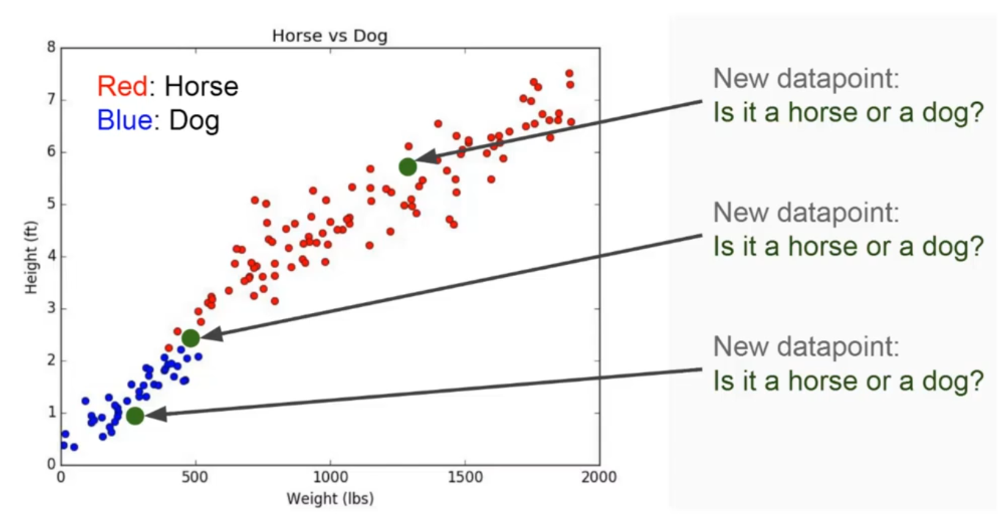

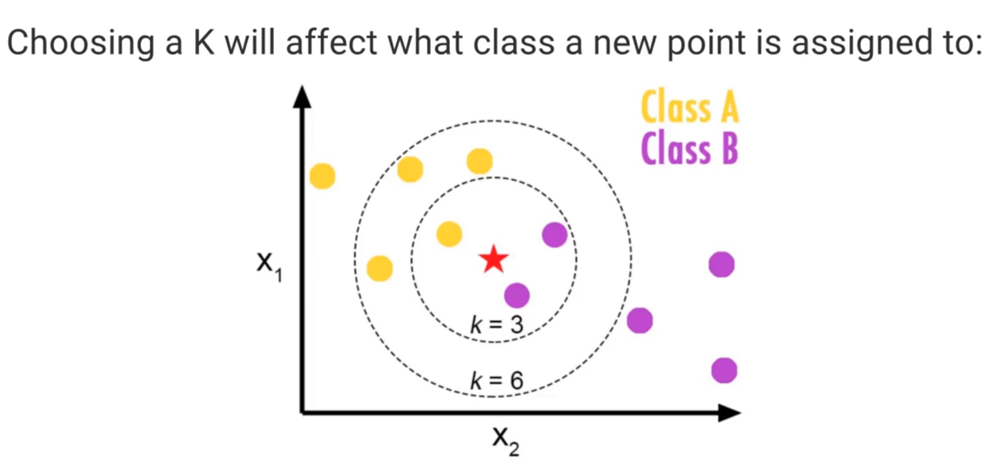

In [23]:
# knn
    # classification algorithm
    # k -- how many neighbors to compare against
    # good for small, simple classifications
        # high prediction cost for large data sets
        # not good with high dimensional data

show_image(fn='knn.png')
show_image(fn='knn2.png')

In [34]:
# knn (k nearest neighbors) (scaler)

# data
df = pd.read_csv('./data/Classified Data', index_col=0)
# scale
    # standard scaler -- standardize features by subtracting the mean and scaling to unit variance.
    # z = (x - u) / s 
    # z -- standard score, x -- input, u -- mean, s -- standard deviation
scaler = StandardScaler()
scaler.fit(df.drop('TARGET CLASS', axis=1))
scaled_features = scaler.transform(df.drop('TARGET CLASS', axis=1))
# recreate (scaled) features df
df_feat = pd.DataFrame(scaled_features, columns=df.columns[:-1])
# input
X = df_feat
y = df['TARGET CLASS']
# split
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=.2, random_state=101)
# model
knn = KNeighborsClassifier(n_neighbors=4)
knn.fit(X_train, y_train)
# prediction
y_pred = knn.predict(X_test)
# metrics
print(confusion_matrix(y_test,y_pred))
print(classification_report(y_test, y_pred))

'''
# test different k values
for i in range(1, 40):
    knn = KNeighborsClassifier(n_neighbors=i)
    knn.fit(X_train, y_train)
    y_pred = knn.predict(X_test)
    error_rate.append(np.mean(y_pred != y_test)) # mean(1,1,0,1,1,0, ...)
    
# visualize runs
plt.figure(figsize=[10,6])
plt.plot(
    range(1,40), error_rate, color='blue', linestyle='dashed', 
    marker='0', markerfacecolor='red', markersize=10
)

'''

[[101   5]
 [ 12  82]]
              precision    recall  f1-score   support

           0       0.89      0.95      0.92       106
           1       0.94      0.87      0.91        94

    accuracy                           0.92       200
   macro avg       0.92      0.91      0.91       200
weighted avg       0.92      0.92      0.91       200



accuracy: 1.0


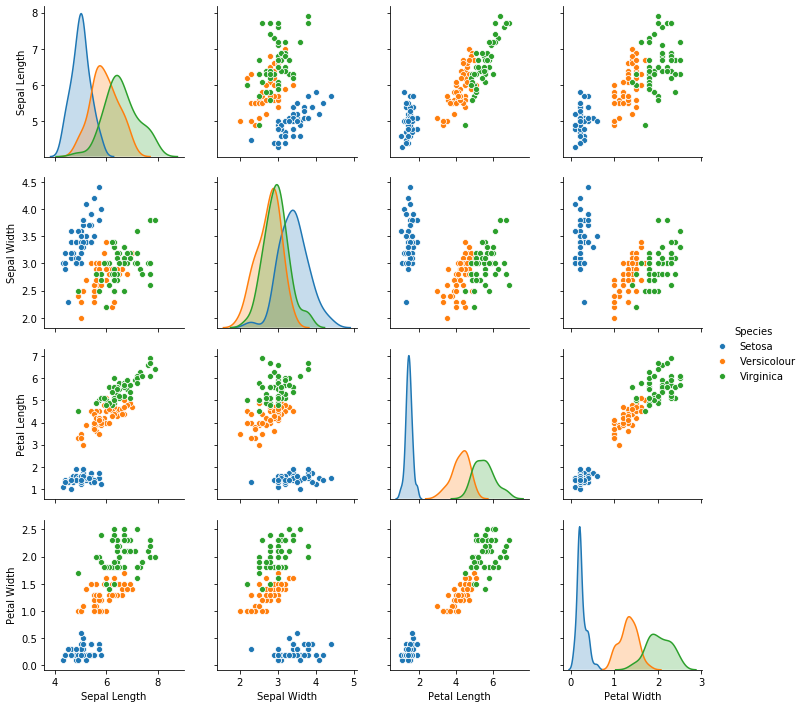

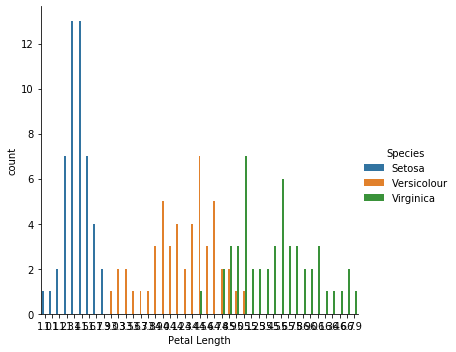

In [65]:
# ------------
# multi-class classification (k-nearest neighbor)
# ------------

# import dataset
from sklearn.datasets import load_iris
# extract dataset
iris = load_iris()
x = iris.data
y = iris.target
# split
X = pd.DataFrame(iris.data, columns=['Sepal Length', 'Sepal Width', 'Petal Length', 'Petal Width'])
y = pd.Series(iris.target)
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.3, random_state=101)
# model
knn = KNeighborsClassifier(n_neighbors=5)
knn.fit(X_train, y_train)
# predict
y_pred = knn.predict(X_test)
acc = metrics.accuracy_score(y_test, y_pred)
print(f"accuracy: {acc}")
# visualize (prep)
df = X
species = pd.Series(y)
species = pd.Series(y)
species = species.replace({0 : 'Setosa', 1 : 'Versicolour', 2 : 'Virginica'})
df['Species'] = species
# visualize
sns.pairplot(df, hue='Species')
sns.catplot(x='Petal Length', data=df, kind='count', hue='Species')

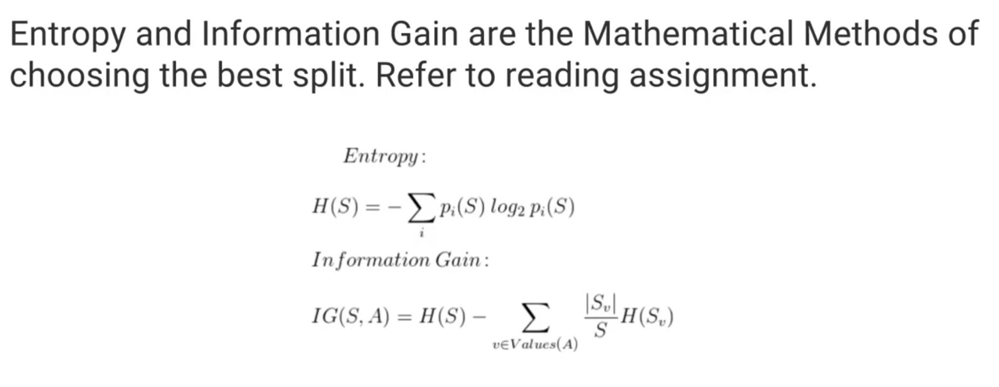

In [36]:
# decision trees
    # node -- split
    # edge -- outcome of split to next node
    # root -- node that performs first split
    # leaves -- terminal nodes that predict outcome

show_image(fn='decision-trees.png')

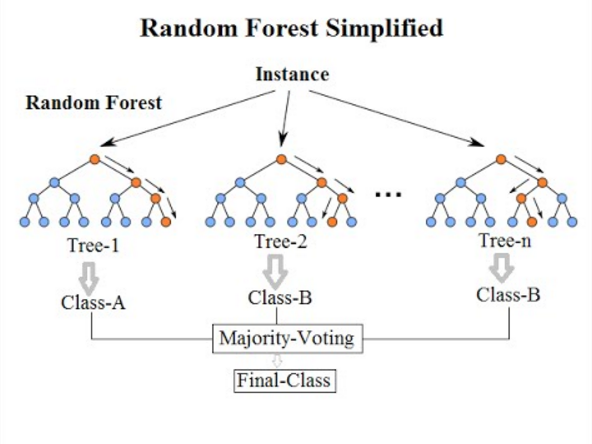

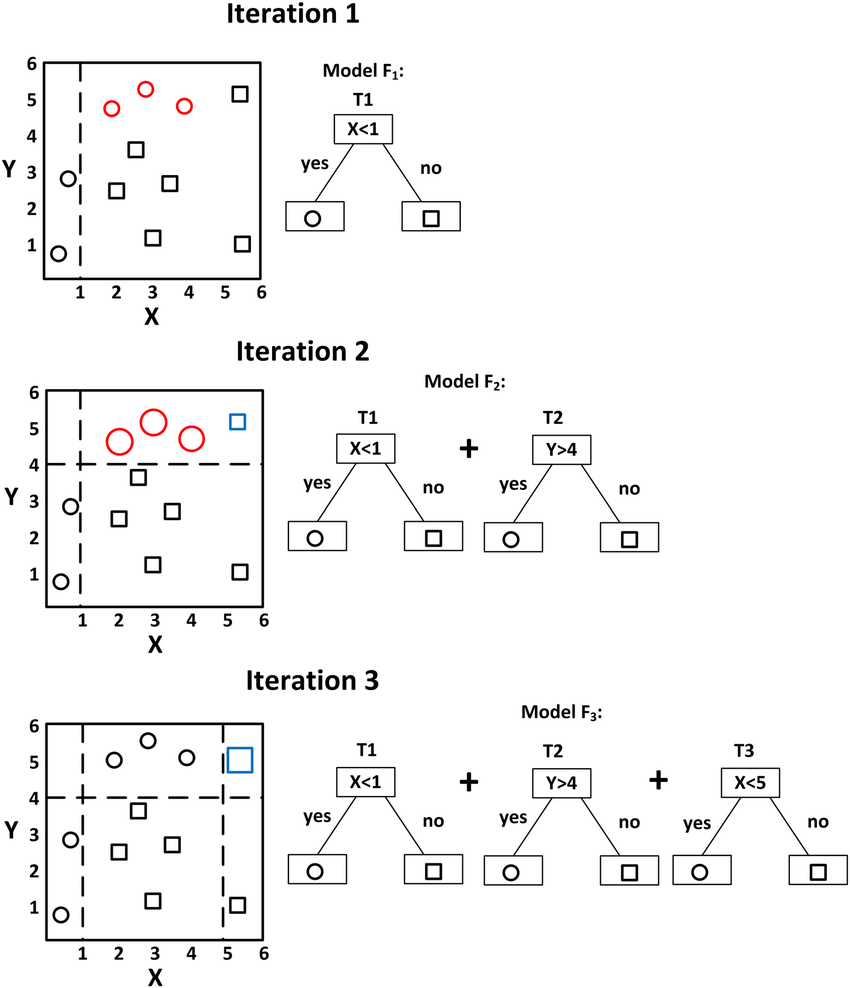

In [38]:
# random forests
    # ensemble methods -- combine several decision trees to produce better predictive performance
        # a group of weak learners work together to form a strong learner
    # bagging 
        # bootstrap aggregation. 
        # used to reduce variance of a decision tree
        # the average of the predictions of multiple different trees is more robust than a single tree.
        # random forest is an extension over bagging. random subset of data, random features used in trees.
    # boosting 
        # collection of predictors.
        # leaners are learned sequentially, and each tree is meant to improve upon the previous tree.
        # when an input is misclassified, its weight is increased to improve the next hypothesis.
        # gradient boosting is an extension over boosting. it uses gradient descent to optimize loss.
        # each sequential tree tries to recover the loss

show_image(fn='random-forest.png')
show_image(fn='gradient-boosting.png')

In [44]:
# decision tree

# data
    # kyphosis -- presence of disorder post-surgery
    # age -- months
    # number -- number of vertebrae
    # start -- first (top-most) vertebrae operated on
df = pd.read_csv('./data/kyphosis.csv')

# visualize
# sns.pairplot(df, hue='Kyphosis')

# split
X = df.drop('Kyphosis', axis=1)
y = df['Kyphosis']
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=.4, random_state=101)
# model
dtree = DecisionTreeClassifier()
dtree.fit(X_train, y_train)
# predictions
y_pred = dtree.predict(X_test)
print(confusion_matrix(y_test, y_pred))
print(classification_report(y_test, y_pred))


[[21  2]
 [ 7  3]]
              precision    recall  f1-score   support

      absent       0.75      0.91      0.82        23
     present       0.60      0.30      0.40        10

    accuracy                           0.73        33
   macro avg       0.68      0.61      0.61        33
weighted avg       0.70      0.73      0.70        33



In [47]:
# random forests

# data
df = pd.read_csv('./data/kyphosis.csv')
# split
X = df.drop('Kyphosis', axis=1)
y = df['Kyphosis']
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=.4, random_state=101)
# model
rfc = RandomForestClassifier(n_estimators=200)
rfc.fit(X_train, y_train)
# predictions
y_pred = rfc.predict(X_test)
print(confusion_matrix(y_test, y_pred))
print(classification_report(y_test, y_pred))


[[23  0]
 [ 8  2]]
              precision    recall  f1-score   support

      absent       0.74      1.00      0.85        23
     present       1.00      0.20      0.33        10

    accuracy                           0.76        33
   macro avg       0.87      0.60      0.59        33
weighted avg       0.82      0.76      0.69        33



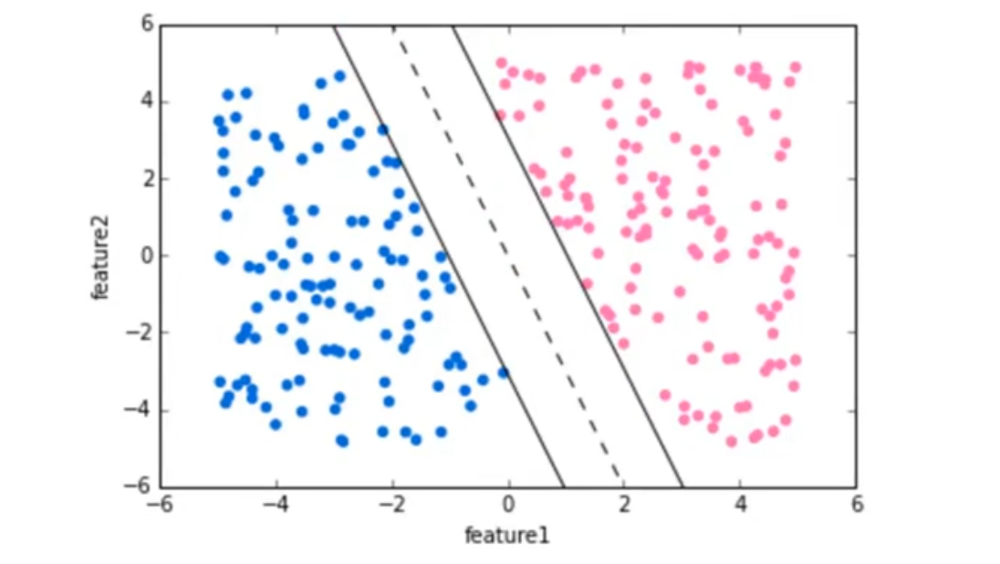

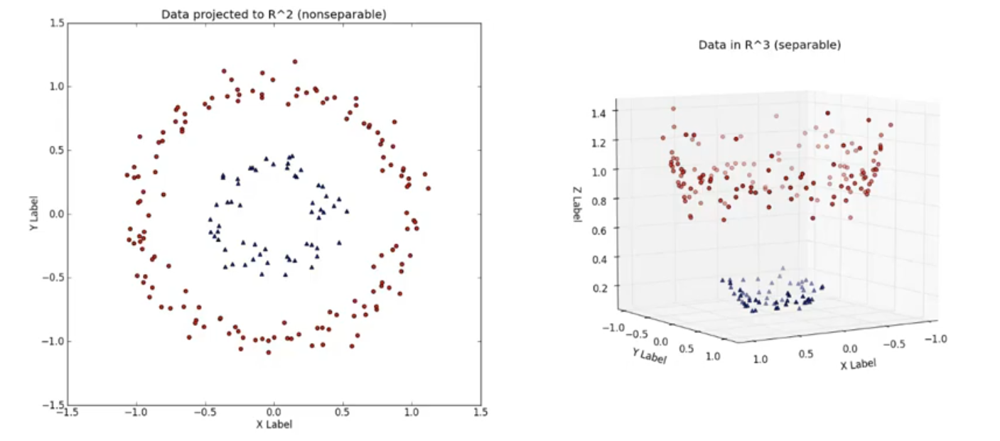

In [6]:
# svm
    # hyperplane -- subspace whose dimension is one less than its ambient space
        # 3d ambient space, 2d hyperplane. 2d ambient space, 1d hyperplane
    # use a 'hyperplane' to separate groupings (classes) of points
    # choose a hyperplane that maximizes  margin between classes
    # the vector points that the margin lines touch are known as 'support vectors'
    # kernel trick can be used to separate non-linearly separable data (R2 to R3)

show_image(fn='svm.png')
show_image(fn='svm-kernel-trick.png')

In [17]:
# svm (linear)

# data
from sklearn.datasets import load_breast_cancer
cancer = load_breast_cancer() # cancer.keys() gives info about this dataset
df_feat = pd.DataFrame(cancer['data'], columns=cancer['feature_names'])

# split
    # dataset already split (for X and y)
X = df_feat
y = cancer['target']
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=.4, random_state=101)

# model
svm_l = svm.SVC(kernel='linear', C=0.1, gamma=0.1)
svm_l.fit(X_train, y_train)
y_pred = svm_l.predict(X_test)

# metric
print(confusion_matrix(y_test, y_pred))
print(classification_report(y_test, y_pred))


[[ 73  10]
 [  5 140]]
              precision    recall  f1-score   support

           0       0.94      0.88      0.91        83
           1       0.93      0.97      0.95       145

    accuracy                           0.93       228
   macro avg       0.93      0.92      0.93       228
weighted avg       0.93      0.93      0.93       228



In [29]:
# svm (radial)
    # grid search to optimize params

# data
from sklearn.datasets import load_breast_cancer
cancer = load_breast_cancer() # cancer.keys() gives info about this dataset
df_feat = pd.DataFrame(cancer['data'], columns=cancer['feature_names'])

# split
    # dataset already split (for X and y)
X = df_feat
y = cancer['target']
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=.4, random_state=101)

# rbf param optimization (cross-validation)
    # C -- large value penalizes more for misclassification
    # gamma -- large gamma value, high bias, low variance
param_grid = {'C': [0.1, 1, 10, 100, 1000], 'gamma': [1, .1, .01, .001, .0001]}
grid = GridSearchCV(estimator=svm.SVC(), param_grid=param_grid)
grid.fit(X_train, y_train)
# best params from grid search
print(grid.best_params_, '\n')
C = grid.best_params_['C']
gamma = grid.best_params_['gamma']

# model
svm_rbf = svm.SVC(kernel='rbf', C=C, gamma=gamma)
svm_rbf.fit(X_train, y_train)
y_pred = svm_rbf.predict(X_test)

# metric
print(confusion_matrix(y_test, y_pred))
print(classification_report(y_test, y_pred))

/home/jly36963/miniconda3/envs/mydataenv/lib/python3.7/site-packages/sklearn/model_selection/_split.py:1978: FutureWarning: The default value of cv will change from 3 to 5 in version 0.22. Specify it explicitly to silence this warning.
  warnings.warn(CV_WARNING, FutureWarning)


{'C': 1, 'gamma': 0.0001} 

[[ 74   9]
 [  8 137]]
              precision    recall  f1-score   support

           0       0.90      0.89      0.90        83
           1       0.94      0.94      0.94       145

    accuracy                           0.93       228
   macro avg       0.92      0.92      0.92       228
weighted avg       0.93      0.93      0.93       228



In [ ]:
# svm 
    # non-probabilistic binary linear classifier
    # model represents points in space, categories are divided by a clear gap (optimal hyperplane)
    # effective in high dimensional spaces, memory efficient, kernels are customizable (versatile)
    # poor performance if num_featuers is much greater than num_samples.
    # svm does not directly provide probability estimates
        # they are calcuated using an expeensive cross-validation.


In [80]:
# ------------
# multi-class classification (svm -- linear, radial, polynomial)
# ------------

# iris dataset
from sklearn.datasets import load_iris
iris = load_iris()
# split
X = pd.DataFrame(iris['data'], columns=['Sepal Length', 'Sepal Width', 'Petal Length', 'Petal Width'])
y = pd.Series(iris['target'])
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.3, random_state=101)

# models

# linear
svm_l = svm.SVC(kernel='linear', C=1.0, gamma='scale')
svm_l.fit(X_train, y_train)
y_pred = svm_l.predict(X_test)
acc = metrics.accuracy_score(y_test, y_pred)
print(f"accuracy of linear: {acc}")
# radial
svm_rbf = svm.SVC(kernel='rbf', C=1.0, gamma='scale')
svm_rbf.fit(X_train, y_train)
y_pred = svm_rbf.predict(X_test)
acc = metrics.accuracy_score(y_test, y_pred)
print(f"accuracy of radial: {acc}")
# polynomial
svm_poly = svm.SVC(kernel='poly', degree=3, C=1.0, gamma='scale')
svm_poly.fit(X_train, y_train)
y_pred = svm_poly.predict(X_test)
acc = metrics.accuracy_score(y_test, y_pred)
print(f"accuracy of polynomial: {acc}")


accuracy of linear: 1.0
accuracy of radial: 0.9777777777777777
accuracy of polynomial: 1.0


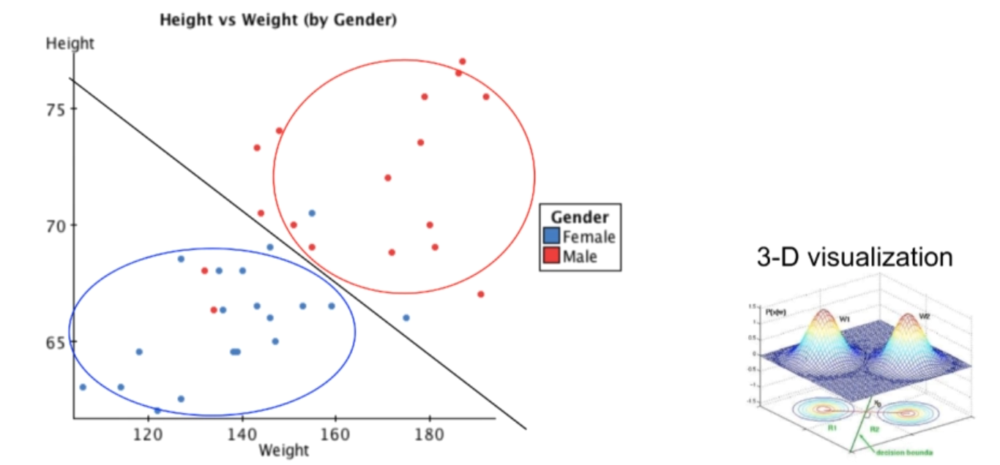

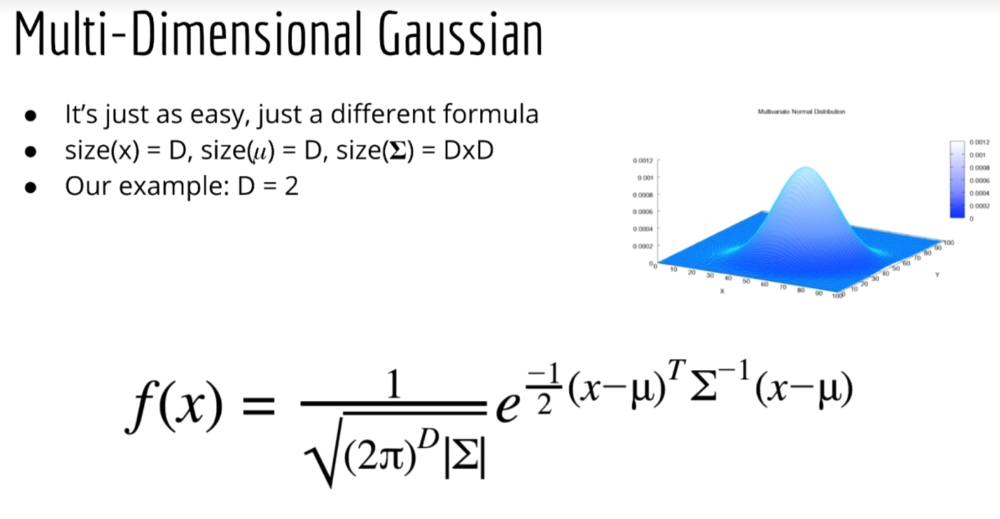

In [85]:
# naive bayes

show_image(fn='naive-bayes.png')
show_image(fn='naive-bayes2.png')

In [82]:
# Gaussian Naive Bayes (GNB)

# sklearn has 3 Naive Bayes variants
    # GaussianNB -- continuous inputs
    # MultinomialNB -- discrete counts (binomial/multinomial)
    # BernoulliNB -- boolean inputs

# iris dataset
from sklearn.datasets import load_iris
iris = load_iris()
# split
X = pd.DataFrame(iris['data'], columns=['Sepal Length', 'Sepal Width', 'Petal Length', 'Petal Width'])
y = pd.Series(iris['target'])
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.3, random_state=101)

# create models
model = GaussianNB()
model.fit(X_train, y_train)
# prediction
y_pred = model.predict(X_test)
acc = metrics.accuracy_score(y_test, y_pred)
print(round(acc, 2))

0.96


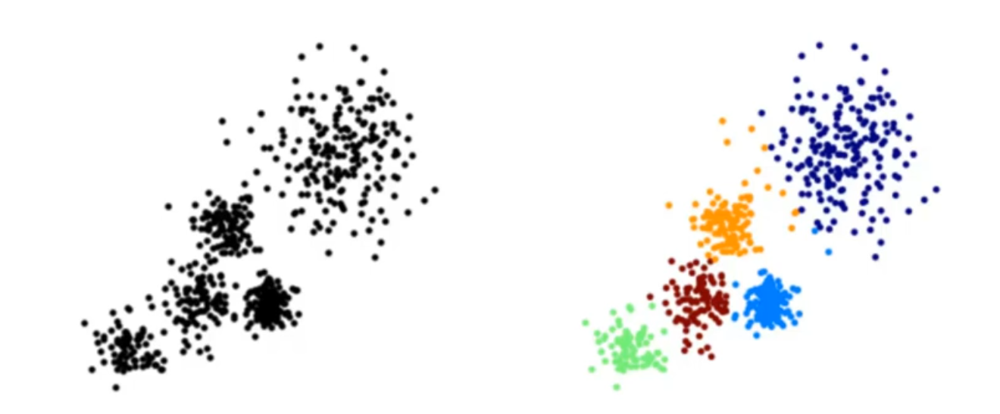

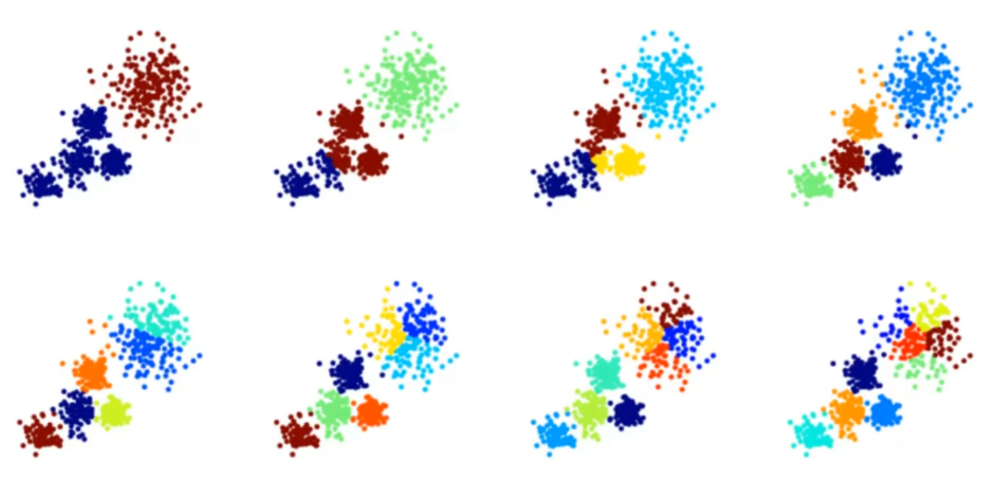

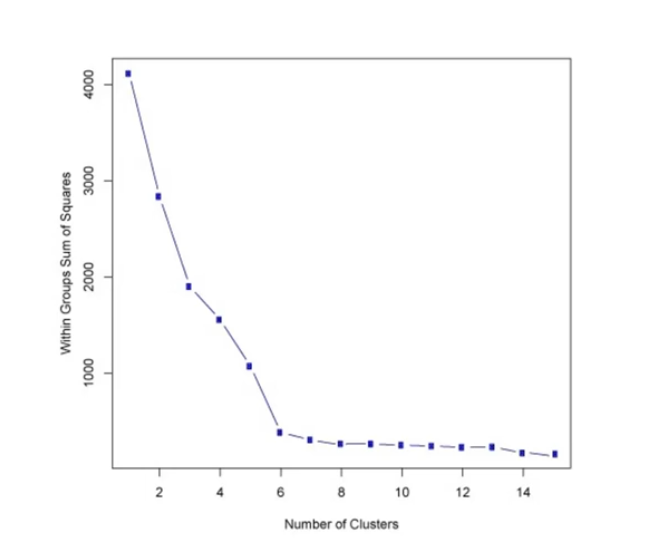

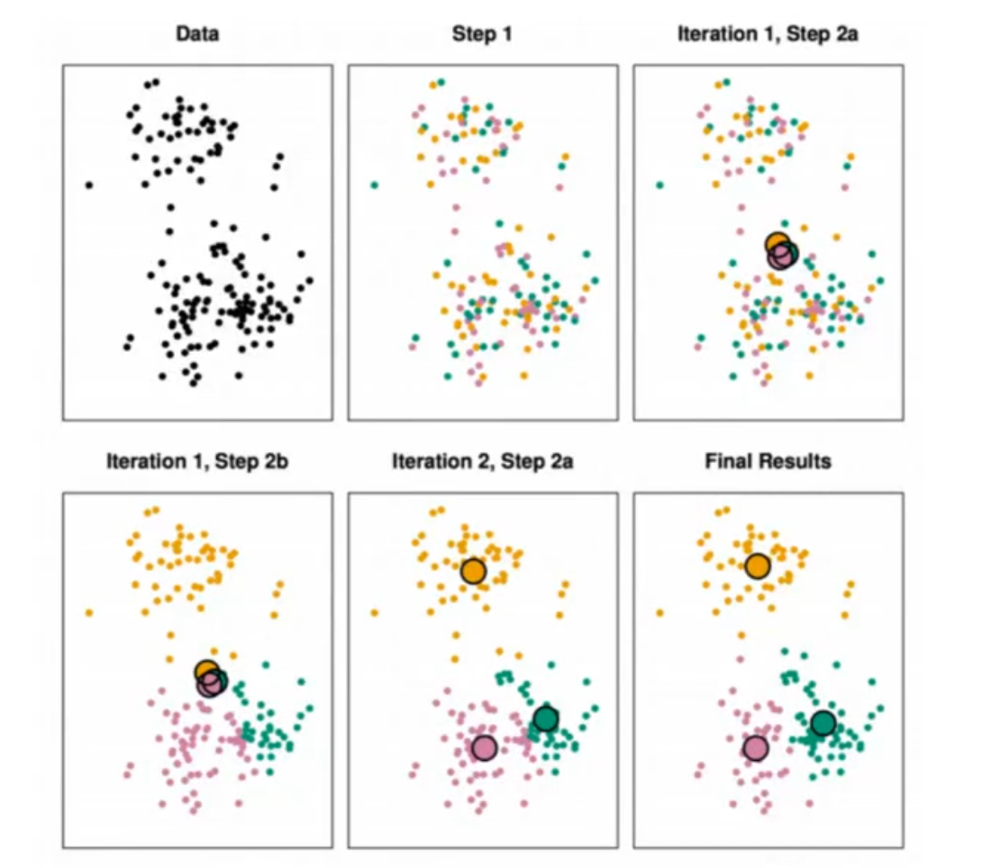

In [33]:
# k means clustering
    # unsupervised learning
    # group similar records/observations
    # process
        # choose anumber of clusters
        # randomly assign each point to a cluster
        # until clusters stop changing:
            # for each cluster, compute cluster centroid (mean vector of points in cluster)
            # assign each data point to the cluster for which the centroid is the closest
    # elbow method
        # compute sum of squared error (SSE) for different values of k
        # SSE is defined as the sum of the squared distance between each cluster member and its centroid
        # choose a k value where SSE decreases abruptly (elbow effect)
        
    
    
show_image(fn='k-means-clustering.png')
show_image(fn='k-means-clustering-kvalue.png')
show_image(fn='k-means-clustering-elbow.png')
show_image(fn='k-means-clustering2.png')

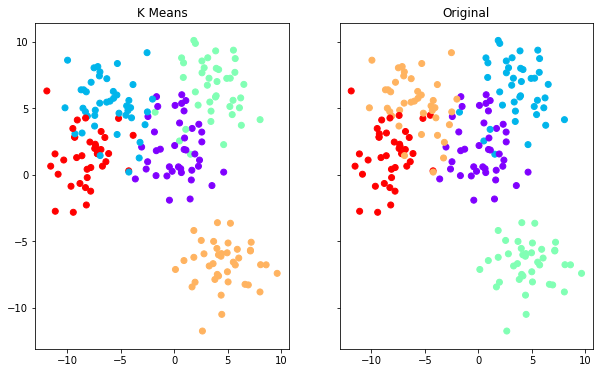

In [44]:
# k means clustering
    # example -- 4 features, 5 groups/centers
    # you might not know how many groups/centers

# artificial/simulated data
from sklearn.datasets import make_blobs
data = make_blobs(n_samples=200, n_features=4, centers=5, cluster_std=2.0, random_state=101)
# split
X = pd.DataFrame(data[0])
y = data[1] # normally you wouldn't have this
# model
kmeans = KMeans(n_clusters=5)
kmeans.fit(X)
# model details
kmeans.cluster_centers_
kmeans.labels_

# check
    # plots show first feature column plotted against second feature column (there are 4 features)
fig, (ax1,ax2) = plt.subplots(1,2, sharey=True, figsize=(10,6))

ax1.set_title('K Means')
ax1.scatter(data[0][:,0], data[0][:,1], c=kmeans.labels_, cmap='rainbow')

ax2.set_title('Original')
ax2.scatter(data[0][:,0], data[0][:,1], c=y, cmap='rainbow')

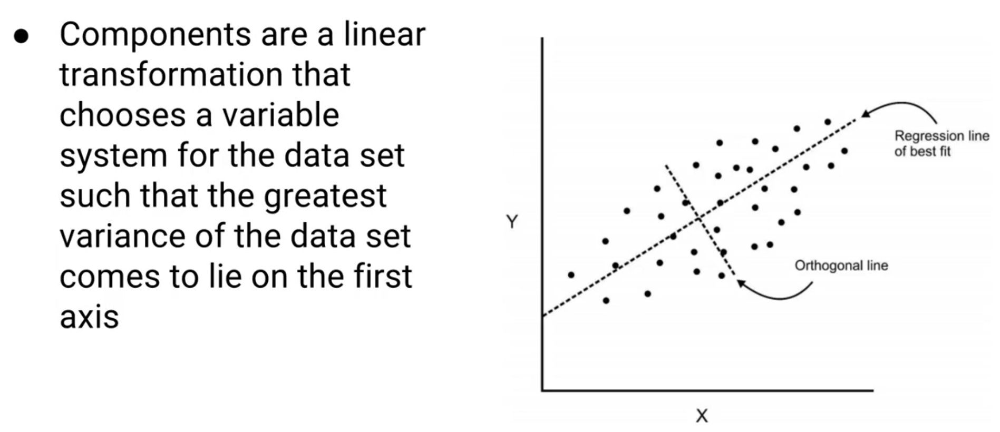

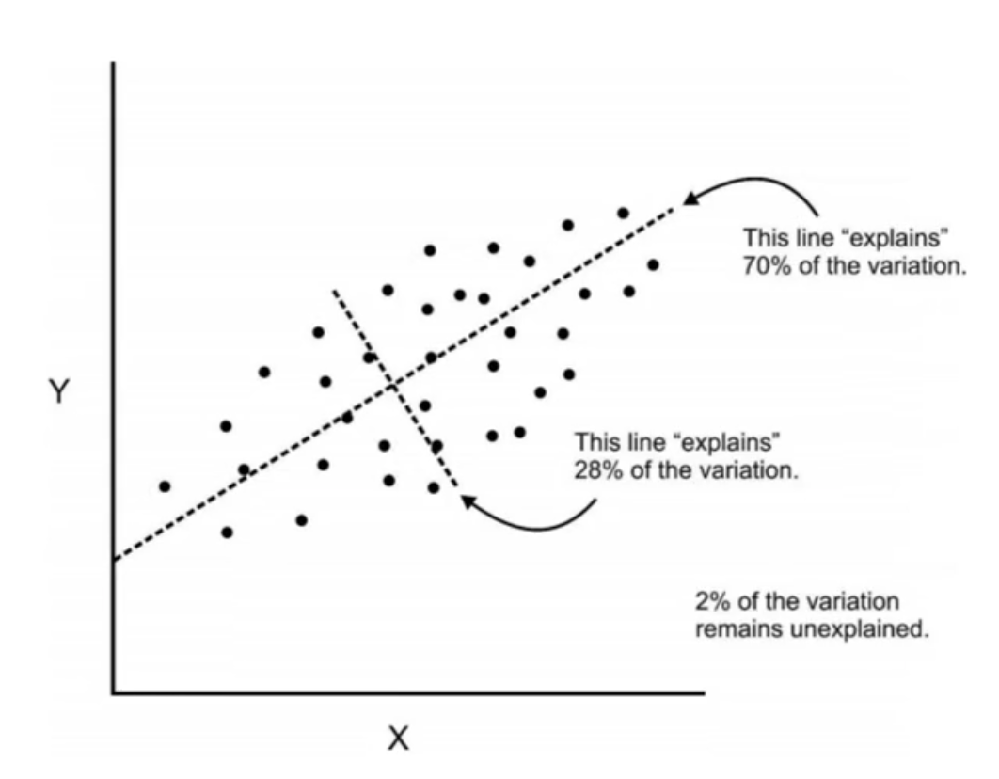

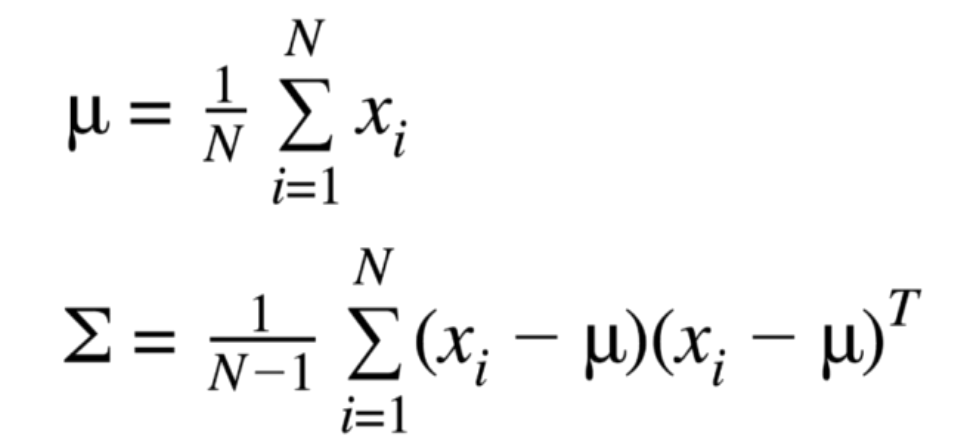

In [86]:
# principal component analysis (PCA)
    # unsupervised learning technique
    # dimension reduction
    # sometimes called 'factor analysis'
    # purpose
        # apply a transformation to the data
        # explain which variables account for the most variance

# resources
    # https://medium.com/machine-learning-world/linear-algebra-svd-and-pca-5979f739e95a
    # https://medium.com/@falgunimukherjee/linear-algebra-for-machine-learning-part-6-dimensionality-reduction-and-pca-5811d42339ec
    # https://towardsdatascience.com/principal-component-analysis-math-and-intuition-post-2-1849090e6b7a
    # http://www.math.union.edu/~jaureguj/PCA.pdf
    # https://www.hackerearth.com/blog/developers/principal-component-analysis-with-linear-algebra/

# PCA process
    # find the mean
    # subtract mean from every component (re-center data)
    # create covariance matrix
        # S = (1 / n-1) * B @ Bt 
    # ...

show_image(fn='pca.png')
show_image(fn='pca2.png')
show_image(fn='covariance-matrix.png')

Text(0, 0.5, 'Second Principal Component')

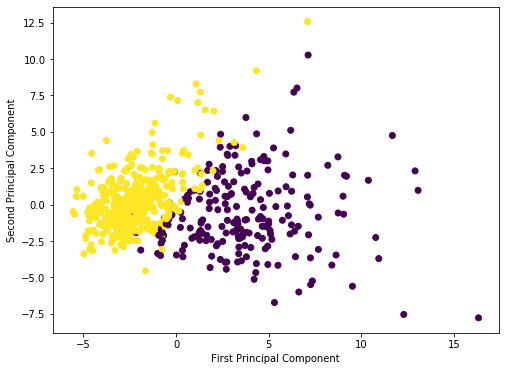

In [54]:
# pca

# data
from sklearn.datasets import load_breast_cancer
cancer = load_breast_cancer()
X = pd.DataFrame(cancer['data'], columns=cancer['feature_names'])
y = cancer['target']

# scale
scaler = StandardScaler()
scaler.fit(X)
scaled_data = scaler.transform(X)

# pca
pca = PCA(n_components=2)
pca.fit(scaled_data)
x_pca = pca.transform(scaled_data) # shape from (569, 30) to (569, 2)

# pca details
    # pca.components_
    # pca.explained_variance_
    # pca.singular_values_

# visualize
plt.figure(figsize=(8,6))
plt.scatter(x_pca[:,0], x_pca[:,1], c=cancer['target'])
plt.xlabel('First Principal Component')
plt.ylabel('Second Principal Component')


In [ ]:
# recommender systems
    # content-based RS -- focuses on attributes of items and gives recommendations based on similarity
    # collaborative filtering (CF) -- wisdom of the crowd (other users liked/bought this as well)
        # memory based CF -- uses cosine similarity
        # model based CF -- uses SVD



In [16]:
# kaggle titanic example (pt1)
    # https://www.kaggle.com/aaysbt/titanic-datasets-eda-fe-dc-model-predictions
    # did the passenger survive?
    
train = pd.read_csv('./data/titanic_train.csv')
test = pd.read_csv('./data/titanic_test.csv')

# -----------
# data preperation steps
# -----------

# fill in missing values (imputation)
# impute age
    # determine average age, based on class
    # fill in null values with associated averages
def impute_age(cols):
    Age = cols[0]
    Pclass = cols[1]
    if pd.isnull(Age):
        if Pclass == 1:
            return 37
        elif Pclass == 2:
            return 29
        elif Pclass == 3:
            return 24
        else:
            return 30 # this fallback value is arbitrary. do better.
    else: return Age
# fill in 'age'
train['Age'] = train[['Age', 'Pclass']].apply(impute_age, axis=1)
# remove 'cabin'
train = train.drop('Cabin', axis=1)
# remove null rows (only a handful left)
train = train.dropna()
# convert categories into dummy values
    # drop_first should be true
    # http://www.statsmodels.org/dev/contrasts.html
sex = pd.get_dummies(train['Sex'], drop_first=True)
embark = pd.get_dummies(train['Embarked'], drop_first=True)
# replace categorical columns with dummy columns
train = pd.concat([train, sex, embark], axis=1)
# drop unusable columns
train = train.drop(['Sex', 'Embarked', 'Name', 'Ticket'], axis=1)

# split
y = train.Survived
X = train.drop('Survived', axis=1)
X_train, X_valid, y_train, y_valid = train_test_split(X, y, test_size=0.2, random_state=101)

In [17]:
# kaggle titanic example (pt2)

# -----------
# classification
# -----------
    
# logistic regression
logr = LogisticRegression(solver='liblinear')
logr.fit(X_train, y_train)
y_pred = logr.predict(X_valid)
acc = metrics.accuracy_score(y_pred, y_valid)
print(f"logistic regression accuracy: {acc}")

# linear SVM
    # https://medium.com/@ankitnitjsr13/math-behind-support-vector-machine-svm-5e7376d0ee4d
model_svm_l = svm.SVC(kernel='linear', C=0.1, gamma=0.1)
model_svm_l.fit(X_train, y_train)
y_pred = model_svm_l.predict(X_valid)
acc = metrics.accuracy_score(y_pred, y_valid)
print(f"linear SVM accuracy: {acc}")

# radial SVM
model_svm_rbf = svm.SVC(kernel='rbf', C=0.1, gamma=0.1)
model_svm_rbf.fit(X_train, y_train)
y_pred = model_svm_rbf.predict(X_valid)
acc = metrics.accuracy_score(y_pred, y_valid)
print(f"radial SVM accuracy: {acc}")

# decision tree
tree = DecisionTreeClassifier()
tree.fit(X_train, y_train)
y_pred = tree.predict(X_valid)
acc = metrics.accuracy_score(y_pred, y_valid)
print(f"decision tree accuracy: {acc}")

# K nearest neighbors (KNN)
knn = KNeighborsClassifier(n_neighbors=4) # most accurate in her example
knn.fit(X_train, y_train)
y_pred = knn.predict(X_valid)
acc = metrics.accuracy_score(y_pred, y_valid)
print(f"knn accuracy: {acc}")

# gaussian naive bayes
gnb = GaussianNB()
gnb.fit(X_train, y_train)
y_pred = gnb.predict(X_valid)
acc = metrics.accuracy_score(y_pred, y_valid)
print(f"gaussian naive bayes accuracy: {acc}")

# random forests
rf = RandomForestClassifier(n_estimators=200) # most accurate in her example
rf.fit(X_train, y_train)
y_pred = rf.predict(X_valid)
acc = metrics.accuracy_score(y_pred, y_valid)
print(f"random forest accuracy: {acc}")

logistic regression accuracy: 0.8089887640449438
linear SVM accuracy: 0.7865168539325843
radial SVM accuracy: 0.601123595505618
decision tree accuracy: 0.7865168539325843
knn accuracy: 0.6573033707865169
gaussian naive bayes accuracy: 0.797752808988764
random forest accuracy: 0.8370786516853933


In [21]:
# kaggle titanic example (pt3)

#------------------
# cross validation
#------------------

# cross validation
    # https://towardsdatascience.com/cross-validation-70289113a072
    # assess how well a model will generalize to an independent data set

kfold = KFold(n_splits=10, random_state=22)
classifiers = [
    'Linear Svm', 'Radial Svm', 'Logistic Regression', 'KNN', 'Decision Tree', 
    'Naive Bayes' , 'Random Forest'
]
models = [
    svm.SVC(kernel='linear', gamma='scale'), svm.SVC(kernel='rbf', gamma='scale'), 
    LogisticRegression(solver='liblinear'), KNeighborsClassifier(n_neighbors=9), 
    DecisionTreeClassifier(), GaussianNB(), RandomForestClassifier(n_estimators=100)
]
# results
cv_mean = []
cv_std = []
cv_acc = []
# cv
for m in models:
    model = m
    cv_result = cross_val_score(model, X, y, cv=kfold, scoring='accuracy')
    cv_mean.append(cv_result.mean())
    cv_std.append(cv_result.std())
    cv_acc.append(cv_result)
    print(f"mean: {cv_result.mean()}")
    
df_results = pd.DataFrame({'CV Mean': cv_mean, 'Std': cv_std}, index=classifiers)
print(df_results)

mean: 0.790755873340143
mean: 0.6445607763023493
mean: 0.7986465781409601
mean: 0.636708375893769
mean: 0.7188585291113381
mean: 0.7829162410623084
mean: 0.820020429009193
                      CV Mean       Std
Linear Svm           0.790756  0.038773
Radial Svm           0.644561  0.069935
Logistic Regression  0.798647  0.033891
KNN                  0.636708  0.072122
Decision Tree        0.718859  0.076656
Naive Bayes          0.782916  0.015733
Random Forest        0.820020  0.030571


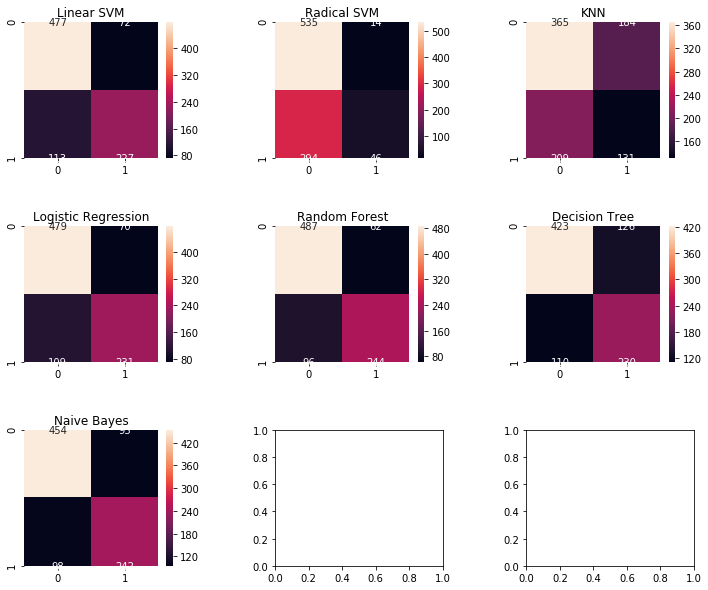

In [24]:
# kaggle titanic example (pt4)

#------------------
# confusion matrix
#------------------

# HEATMAP IS BROKEN FOR MATPLOTLIB 3.1.1

f, ax = plt.subplots(3,3, figsize=(12,10))
y_pred = cross_val_predict(svm.SVC(kernel='linear', gamma='scale'),X,y,cv=10)
sns.heatmap(confusion_matrix(y,y_pred), ax=ax[0,0], annot=True,fmt='2.0f')
ax[0,0].set_title('Linear SVM')

y_pred = cross_val_predict(svm.SVC(kernel='rbf', gamma='scale'),X,y,cv=10)
sns.heatmap(confusion_matrix(y,y_pred), ax=ax[0,1], annot=True,fmt='2.0f')
ax[0,1].set_title('Radical SVM')

y_pred = cross_val_predict(KNeighborsClassifier(n_neighbors=9) ,X,y,cv=10)
sns.heatmap(confusion_matrix(y,y_pred), ax=ax[0,2], annot=True,fmt='2.0f')
ax[0,2].set_title('KNN')

y_pred = cross_val_predict(LogisticRegression(solver='liblinear') ,X,y,cv=10)
sns.heatmap(confusion_matrix(y,y_pred), ax=ax[1,0], annot=True,fmt='2.0f')
ax[1,0].set_title('Logistic Regression')

y_pred = cross_val_predict(RandomForestClassifier(n_estimators=100) ,X,y,cv=10)
sns.heatmap(confusion_matrix(y,y_pred), ax=ax[1,1], annot=True,fmt='2.0f')
ax[1,1].set_title('Random Forest')

y_pred = cross_val_predict(DecisionTreeClassifier() ,X,y,cv=10)
sns.heatmap(confusion_matrix(y,y_pred), ax=ax[1,2], annot=True,fmt='2.0f')
ax[1,2].set_title('Decision Tree')

y_pred = cross_val_predict(GaussianNB() ,X,y,cv=10)
sns.heatmap(confusion_matrix(y,y_pred), ax=ax[2,0], annot=True,fmt='2.0f')
ax[2,0].set_title('Naive Bayes')

plt.subplots_adjust(hspace=0.5, wspace=0.5)
plt.show()